In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,roc_curve,auc
import xgboost
from xgboost import XGBRegressor
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Bias_correction_ucl.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [3]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [4]:
df['station'] = df['station'].fillna(0)
df['Date'] = df['Date'].fillna(0)
df['Present_Tmax'] = df['Present_Tmax'].fillna(0)
df['Present_Tmin'] = df['Present_Tmin'].fillna(0)
df['LDAPS_RHmin'] = df['LDAPS_RHmin'].fillna(0)
df['LDAPS_RHmax'] = df['LDAPS_RHmax'].fillna(0)
df['LDAPS_Tmax_lapse'] = df['LDAPS_Tmax_lapse'].fillna(0)
df['LDAPS_Tmin_lapse'] = df['LDAPS_Tmin_lapse'].fillna(0)
df['LDAPS_WS'] = df['LDAPS_WS'].fillna(0)
df['LDAPS_LH'] = df['LDAPS_LH'].fillna(0)
df['LDAPS_CC1'] = df['LDAPS_CC1'].fillna(0)
df['LDAPS_CC2'] = df['LDAPS_CC2'].fillna(0)
df['LDAPS_CC3'] = df['LDAPS_CC3'].fillna(0)
df['LDAPS_CC4'] = df['LDAPS_CC4'].fillna(0)
df['LDAPS_PPT1'] = df['LDAPS_PPT1'].fillna(0)
df['LDAPS_PPT2'] = df['LDAPS_PPT2'].fillna(0)
df['LDAPS_PPT3'] = df['LDAPS_PPT3'].fillna(0)
df['LDAPS_PPT4'] = df['LDAPS_PPT4'].fillna(0)
df['Next_Tmax'] = df['Next_Tmax'].fillna(0)
df['Next_Tmin'] = df['Next_Tmin'].fillna(0)

In [5]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

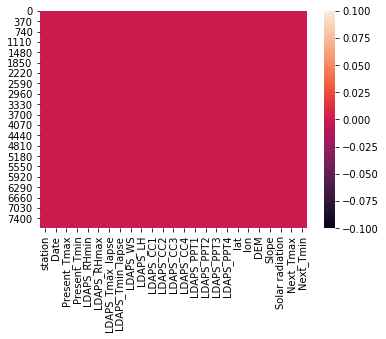

In [6]:
sns.heatmap(df.isnull())

In [7]:
df.shape

(7752, 25)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Date              7752 non-null   object 
 2   Present_Tmax      7752 non-null   float64
 3   Present_Tmin      7752 non-null   float64
 4   LDAPS_RHmin       7752 non-null   float64
 5   LDAPS_RHmax       7752 non-null   float64
 6   LDAPS_Tmax_lapse  7752 non-null   float64
 7   LDAPS_Tmin_lapse  7752 non-null   float64
 8   LDAPS_WS          7752 non-null   float64
 9   LDAPS_LH          7752 non-null   float64
 10  LDAPS_CC1         7752 non-null   float64
 11  LDAPS_CC2         7752 non-null   float64
 12  LDAPS_CC3         7752 non-null   float64
 13  LDAPS_CC4         7752 non-null   float64
 14  LDAPS_PPT1        7752 non-null   float64
 15  LDAPS_PPT2        7752 non-null   float64
 16  LDAPS_PPT3        7752 non-null   float64


In [9]:
for col in df:
    print(type(df[col][1]))

<class 'numpy.float64'>
<class 'str'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>
<class 'numpy.float64'>


In [10]:
df['Day']=df['Date'].str.split('-').str[0]

df['Month']=df['Date'].str.split('-').str[1]

df['Year']=df['Date'].str.split('-').str[2]

df.drop(['Date'],axis=1,inplace=True)

In [11]:
df.head(10)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013,06,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013,06,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013,06,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013,06,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013,06,30
5,6.0,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,0.185279,...,37.5102,127.042,54.6384,0.1457,5873.780762,31.5,24.0,2013,06,30
6,7.0,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,0.389600,...,37.5776,126.838,12.3700,0.0985,5849.233398,30.9,23.4,2013,06,30
7,8.0,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,0.357856,...,37.4697,126.910,52.5180,1.5629,5863.992188,31.1,22.9,2013,06,30
8,9.0,31.4,22.0,55.338791,80.784607,28.426975,23.332373,6.017135,85.110971,0.408766,...,37.4967,126.826,50.9312,0.4125,5876.901367,31.3,21.6,2013,06,30
9,10.0,31.6,20.5,56.651203,86.849632,27.576705,22.527018,6.518841,63.006075,0.348292,...,37.4562,126.955,208.5070,5.1782,5893.608398,30.5,21.0,2013,06,30


In [12]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 2
Month               2
Year                2
dtype: int64

In [13]:
df['Day'] = df['Day'].fillna(0)
df['Month'] = df['Month'].fillna(0)
df['Year'] = df['Year'].fillna(0)

In [14]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

In [15]:
df.dtypes

station             float64
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
Day                  object
Month                object
Year                 object
dtype: object

In [16]:
df['Day']=df['Day'].astype(int)
df['Month']=df['Month'].astype(int)
df['Year']=df['Year'].astype(int)

In [17]:
df.dtypes

station             float64
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
Day                   int32
Month                 int32
Year                  int32
dtype: object

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Present_Tmax      7752 non-null   float64
 2   Present_Tmin      7752 non-null   float64
 3   LDAPS_RHmin       7752 non-null   float64
 4   LDAPS_RHmax       7752 non-null   float64
 5   LDAPS_Tmax_lapse  7752 non-null   float64
 6   LDAPS_Tmin_lapse  7752 non-null   float64
 7   LDAPS_WS          7752 non-null   float64
 8   LDAPS_LH          7752 non-null   float64
 9   LDAPS_CC1         7752 non-null   float64
 10  LDAPS_CC2         7752 non-null   float64
 11  LDAPS_CC3         7752 non-null   float64
 12  LDAPS_CC4         7752 non-null   float64
 13  LDAPS_PPT1        7752 non-null   float64
 14  LDAPS_PPT2        7752 non-null   float64
 15  LDAPS_PPT3        7752 non-null   float64
 16  LDAPS_PPT4        7752 non-null   float64


In [21]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.996646,29.499407,23.015338,56.210230,87.519784,29.326939,23.285106,7.029203,61.900288,0.365206,...,37.544722,126.991397,61.867972,1.257048,5341.502803,30.169440,22.852348,2014.480134,7.465815,15.979747
std,7.213660,4.083116,3.256071,15.618676,11.227876,4.123757,3.277967,2.281613,34.120103,0.263668,...,0.050352,0.079435,54.279780,1.370444,429.158867,3.596114,2.827042,32.394355,0.543661,8.921191
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-13.603212,0.000000,...,37.456200,126.826000,12.370000,0.098475,4329.520508,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,27.700000,21.600000,45.735368,84.038809,27.601014,22.032374,5.647741,36.776474,0.141643,...,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000,2014.000000,7.000000,8.000000
50%,13.000000,29.900000,23.400000,54.828714,89.699505,29.662273,23.735942,6.531345,56.487289,0.312156,...,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,2015.000000,7.000000,16.000000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,...,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,2016.000000,8.000000,24.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,2017.000000,8.000000,31.000000


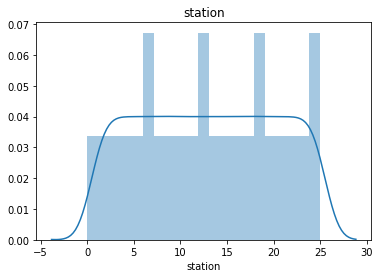

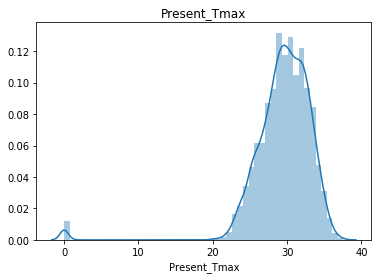

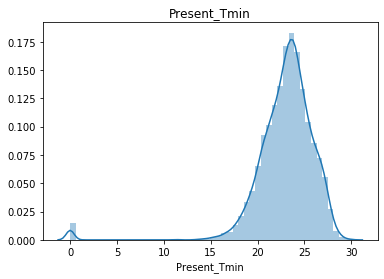

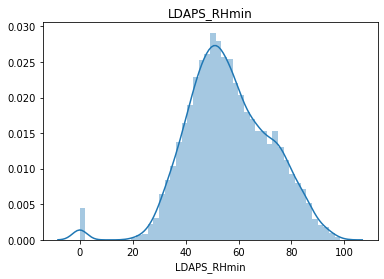

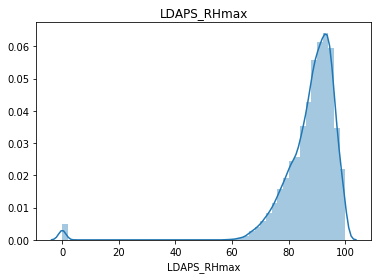

...

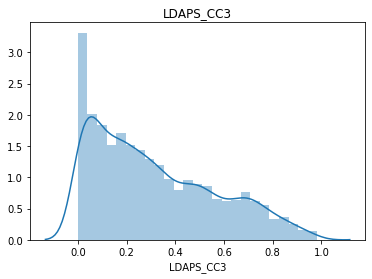

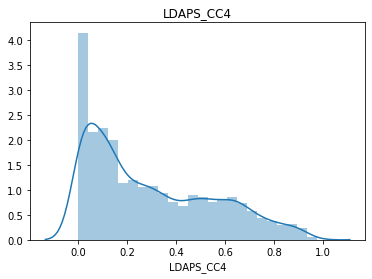

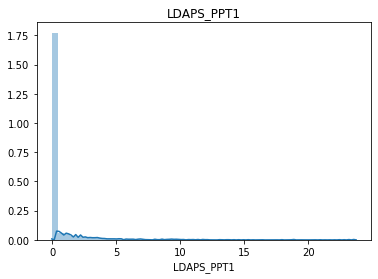

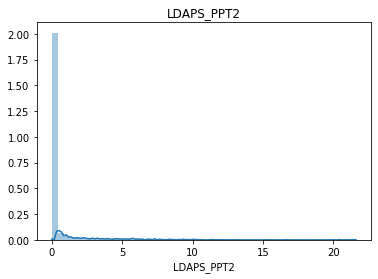

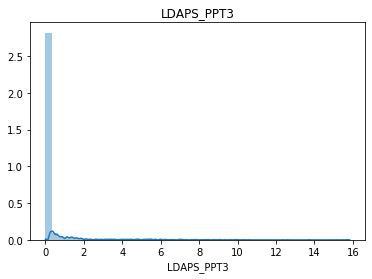

RuntimeError: Selected KDE bandwidth is 0. Cannot estiamte density.

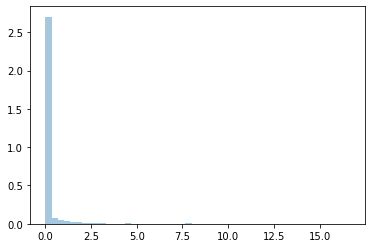

In [22]:
for i in df:
    plt.figure()
    plt.clf() #clearing the figure
    sns.distplot(df[i])
    plt.title(i)
    plt.show()

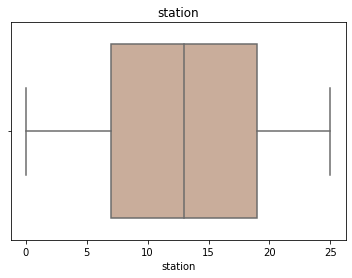

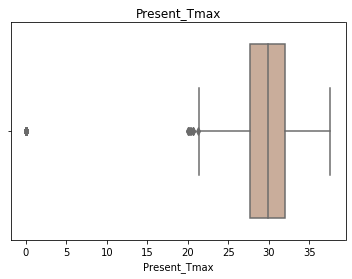

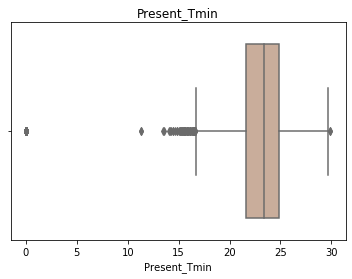

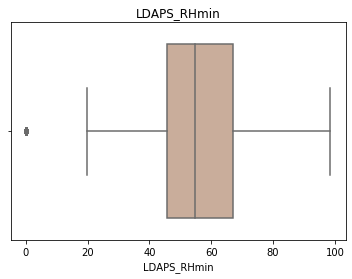

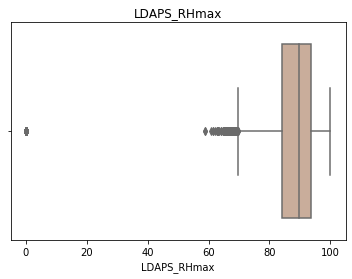

...

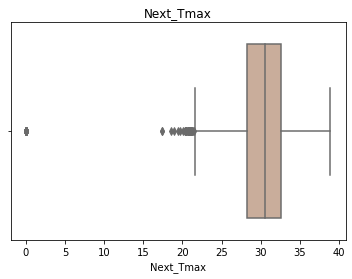

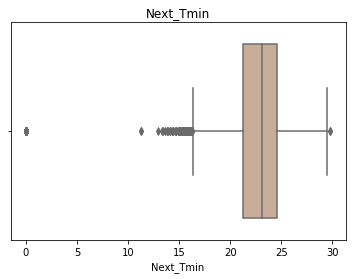

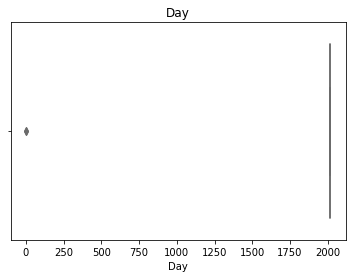

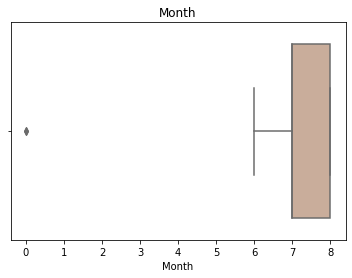

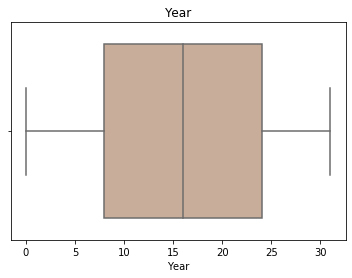

In [23]:
for i in df:
    plt.figure()
    plt.clf() #clearing the figure
    sns.boxplot(df[i],palette="pink")
    plt.title(i)
    plt.show()

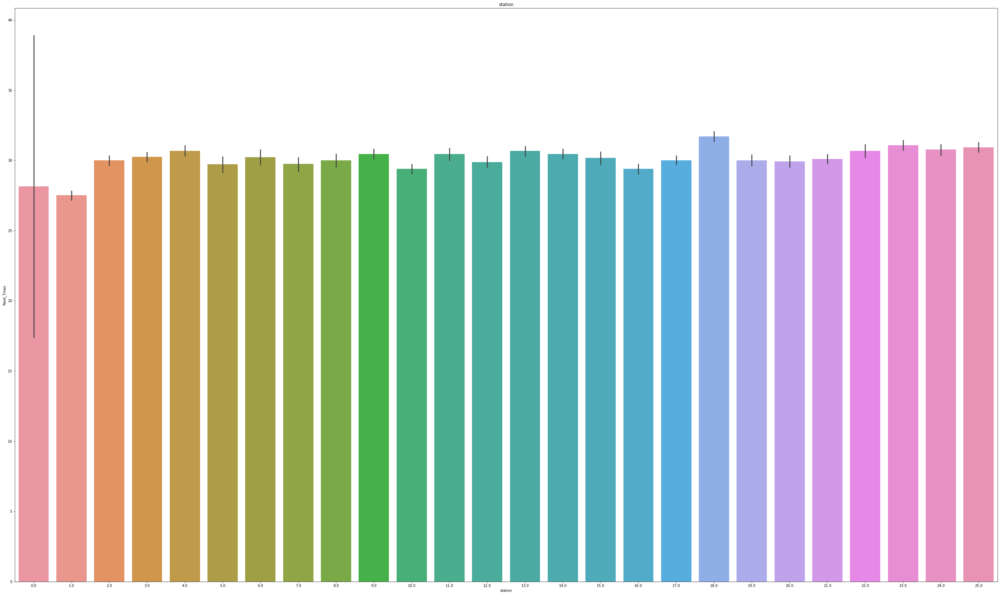

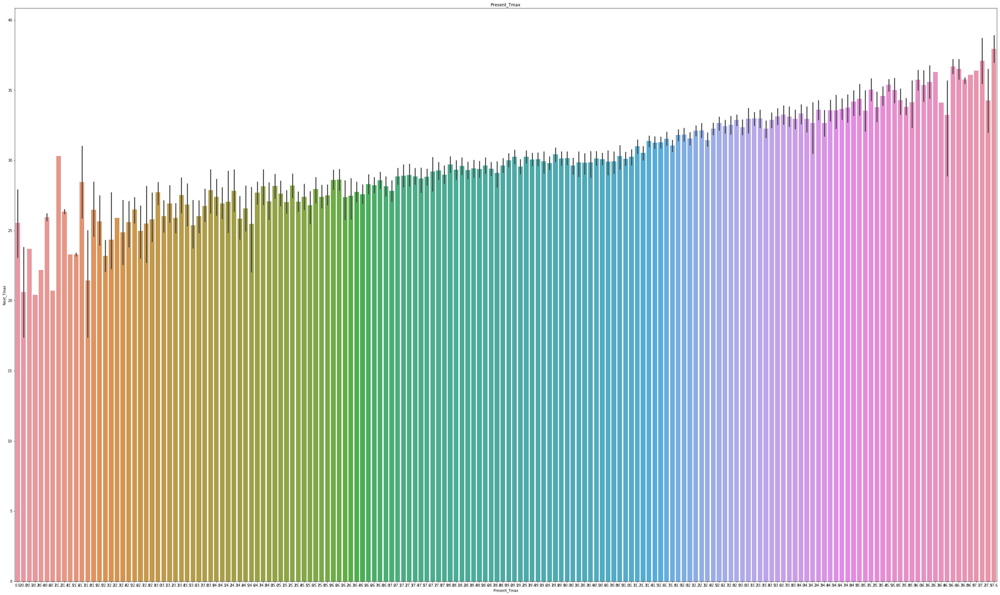

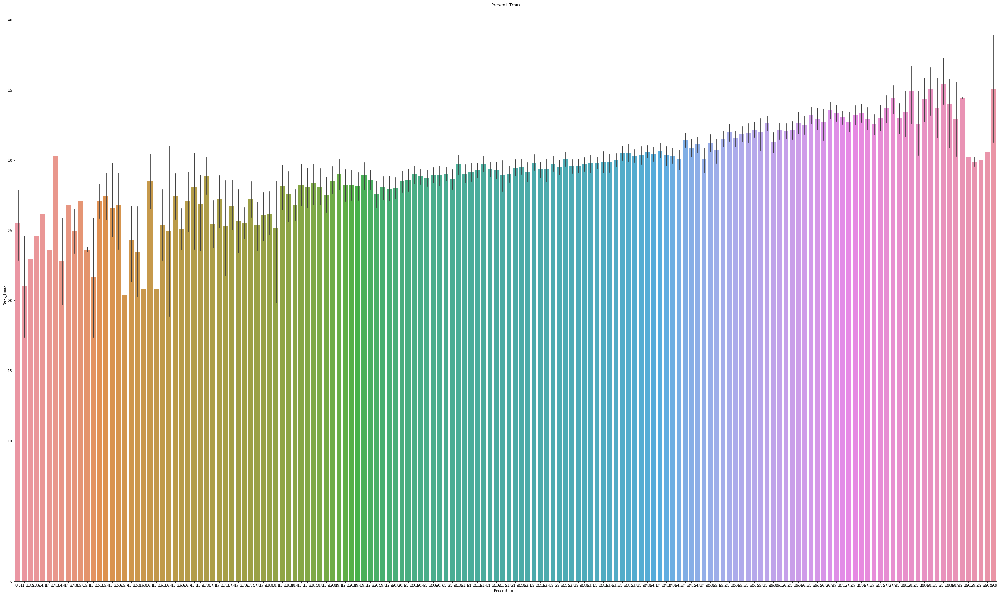

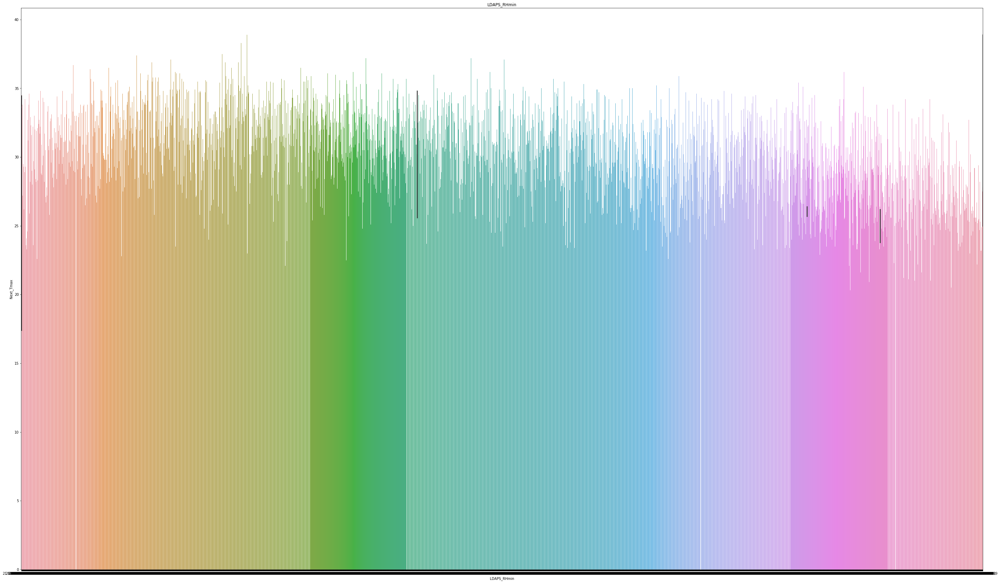

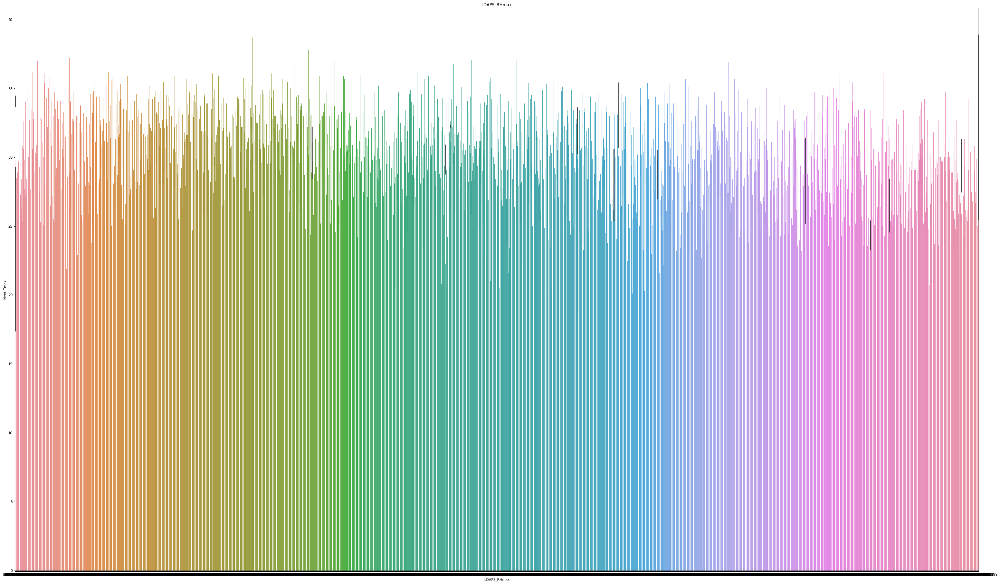

...

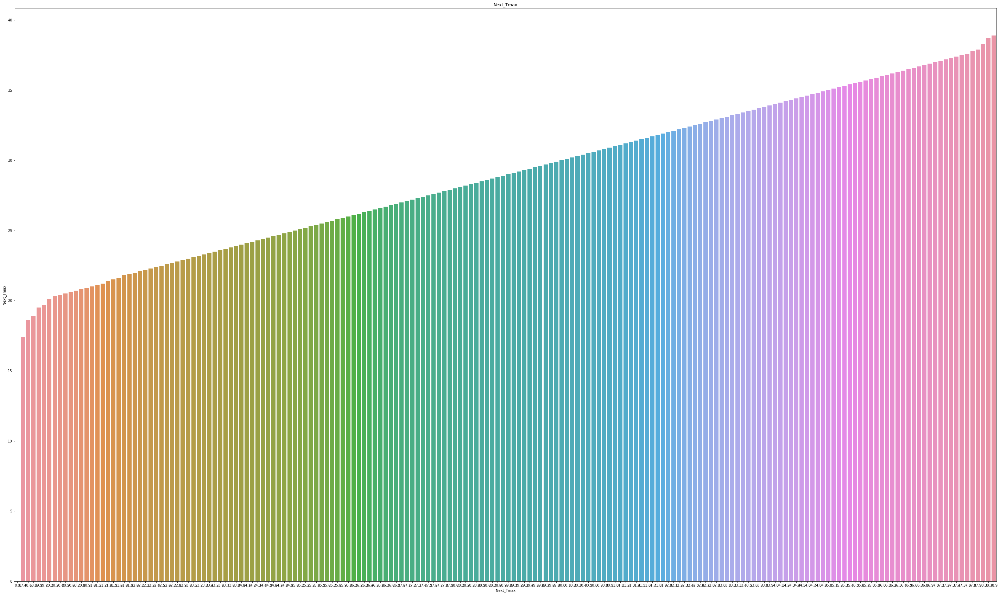

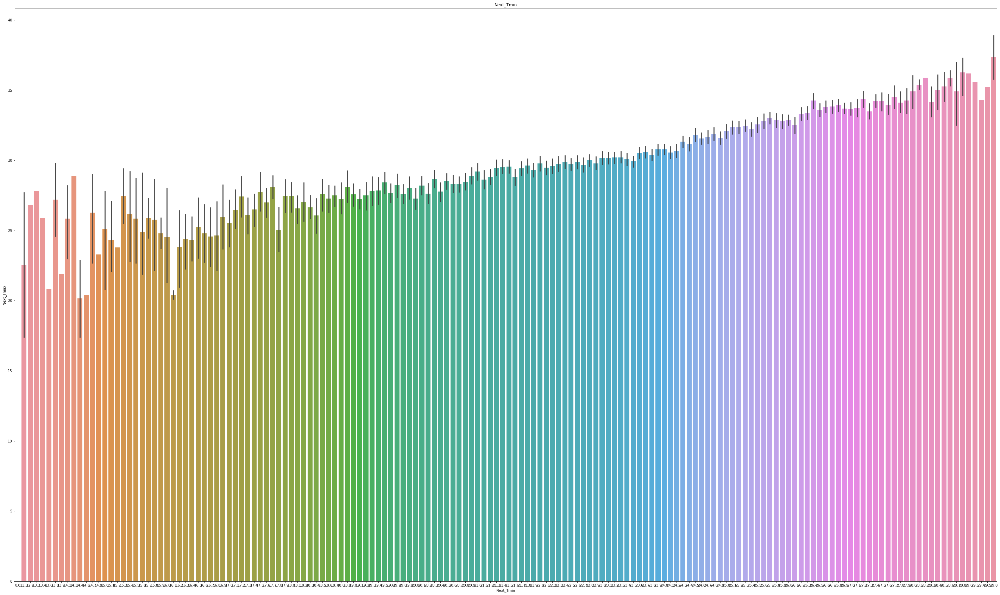

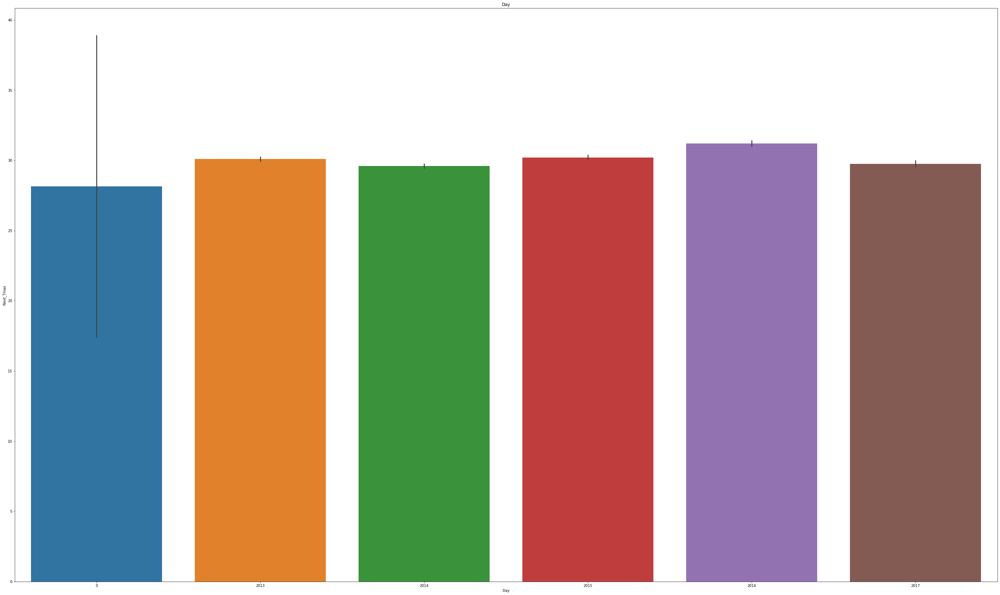

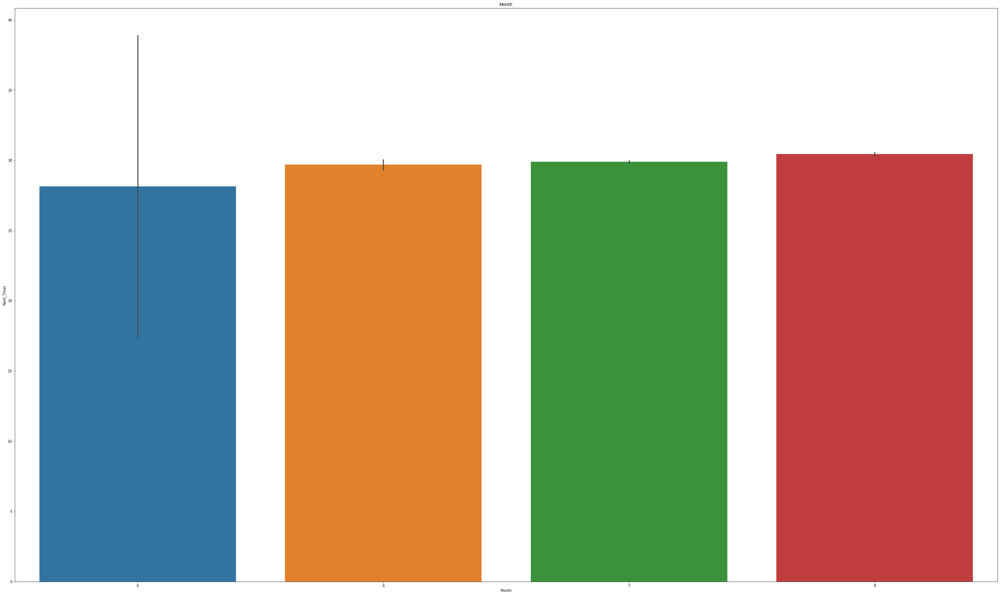

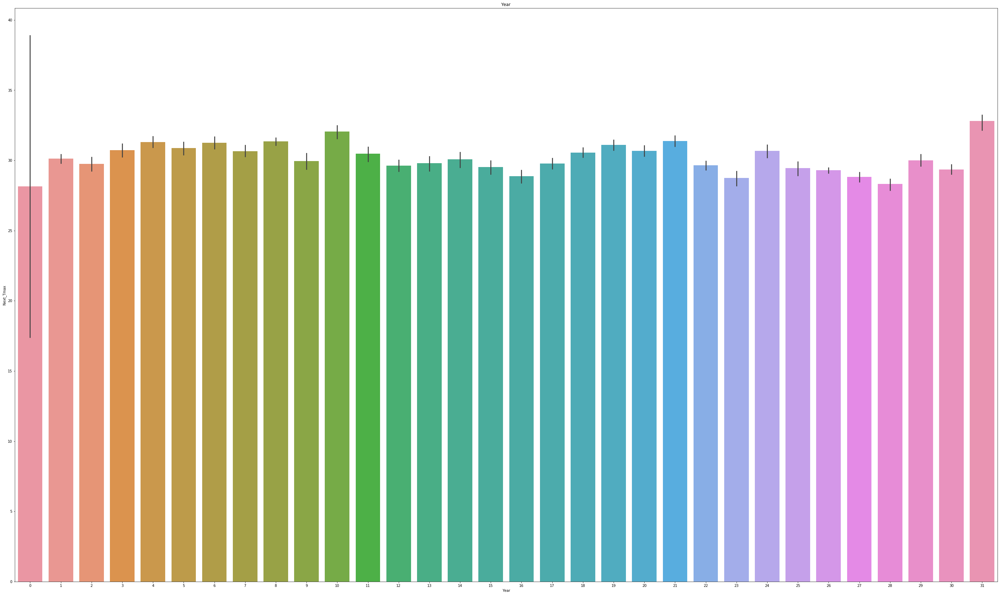

In [24]:
for i in df:
    plt.figure(figsize=(50,30))
    plt.clf() #clearing the figure
    sns.barplot(x=df[i],y=df['Next_Tmax'],data=df)
    plt.title(i)
    plt.show()

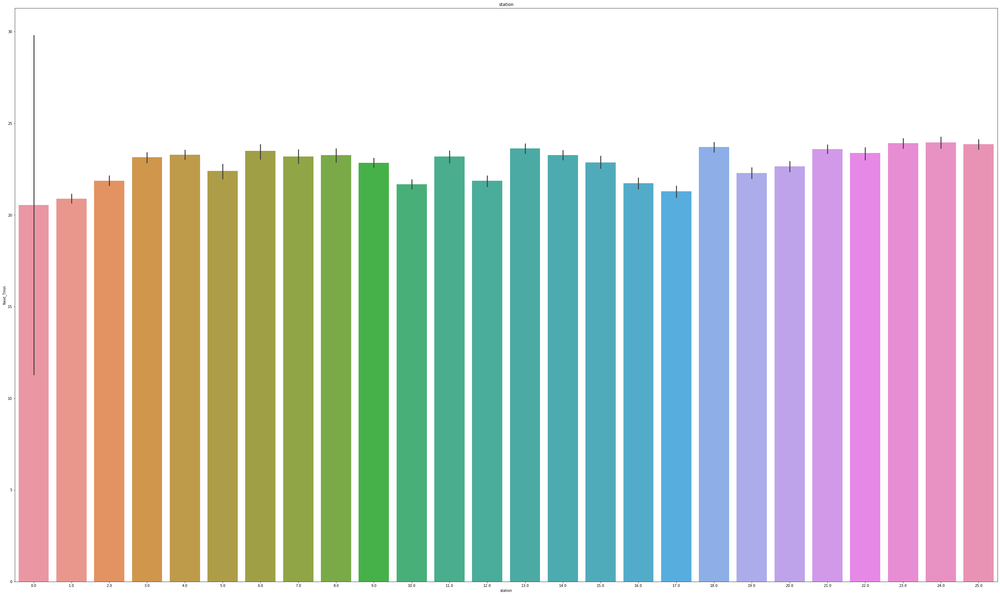

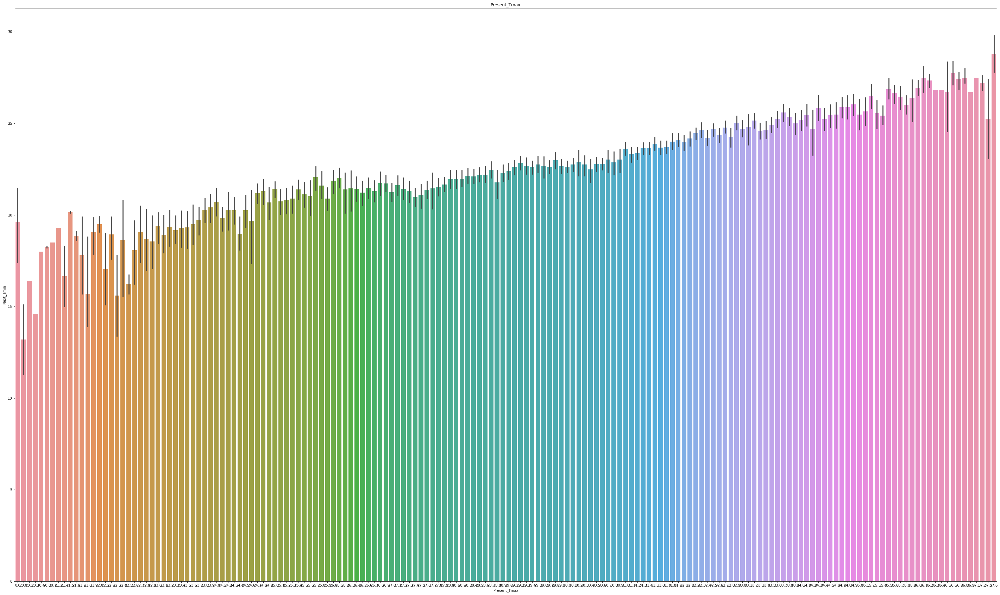

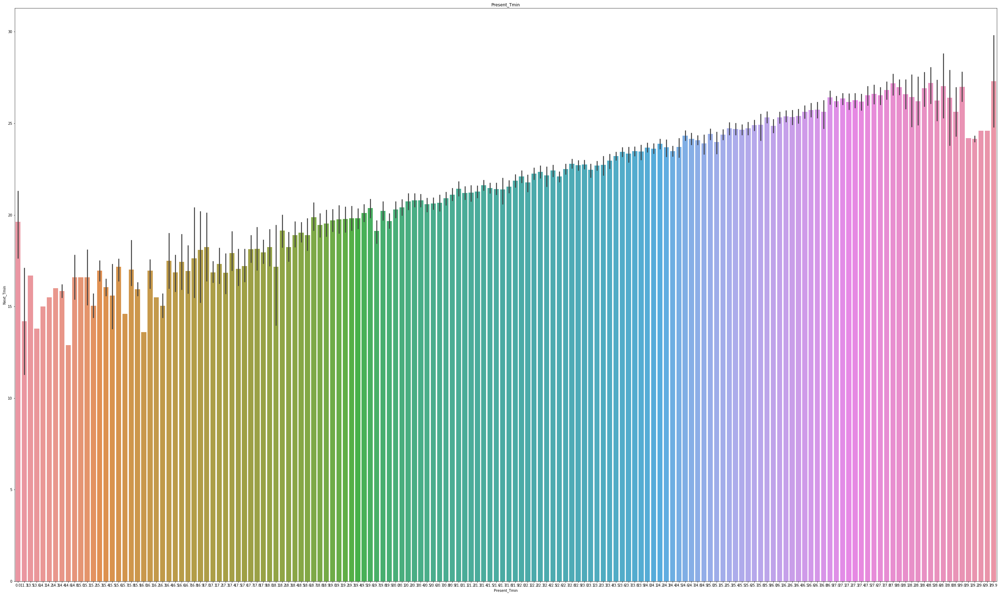

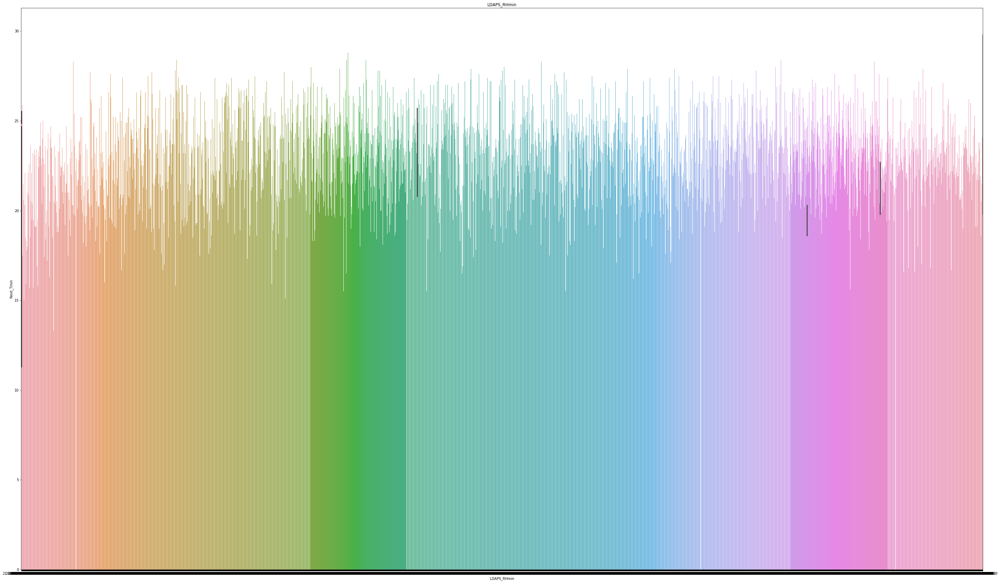

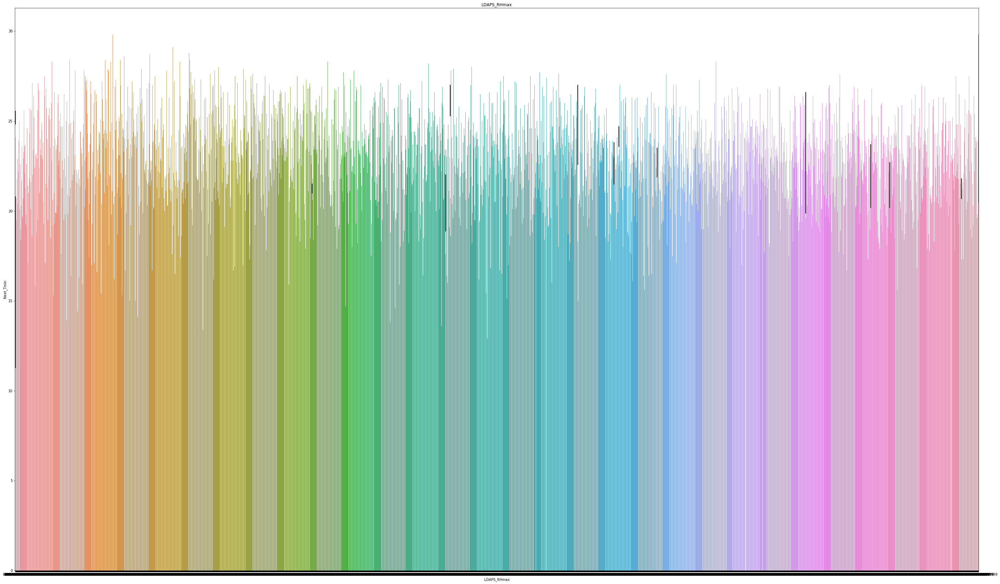

...

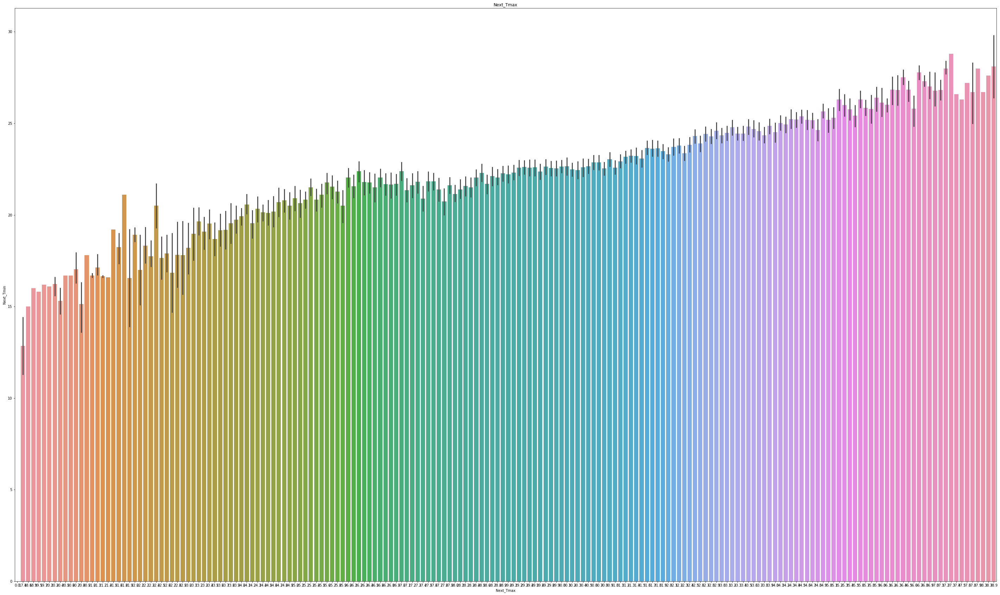

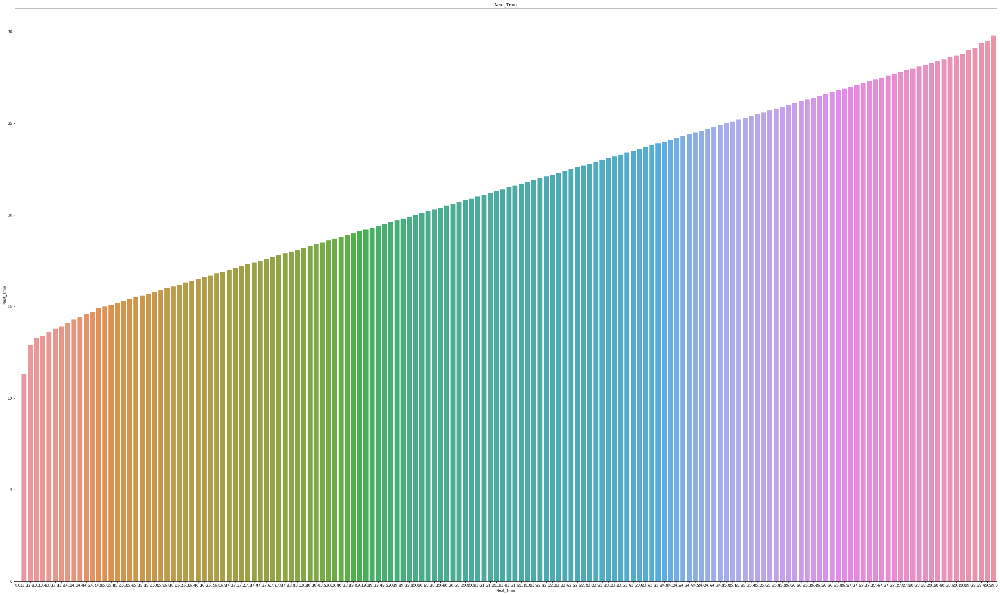

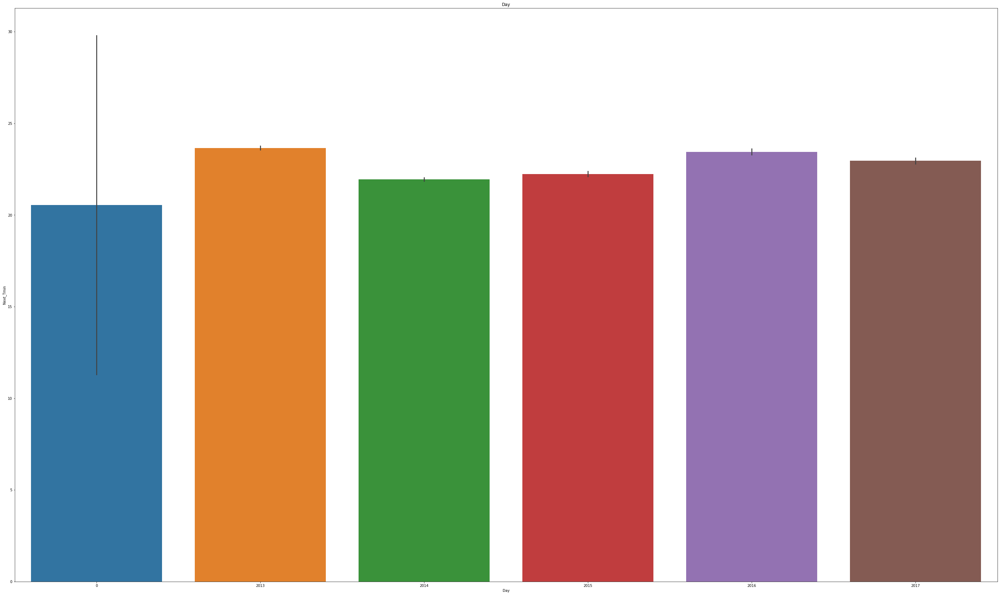

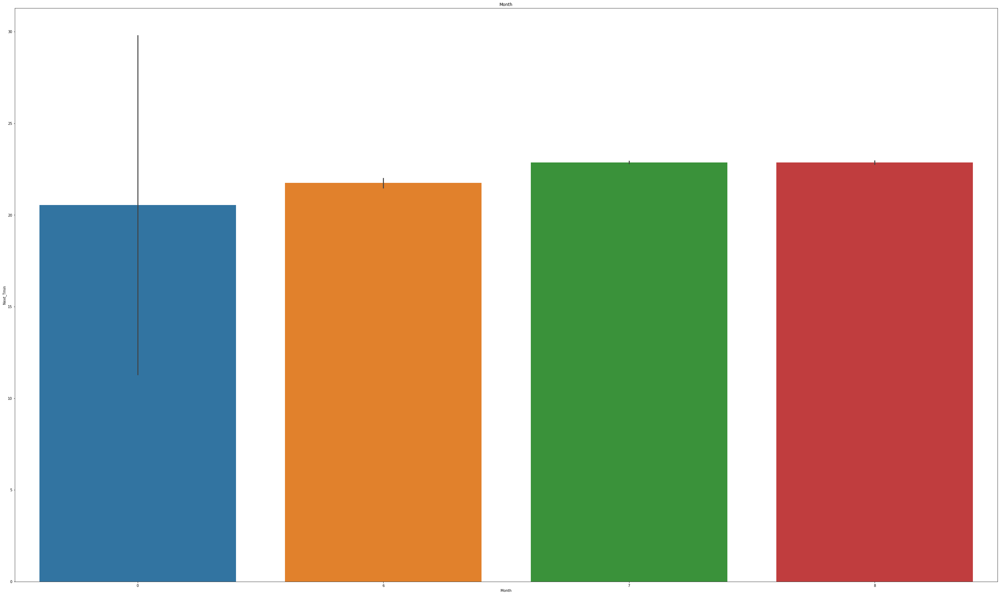

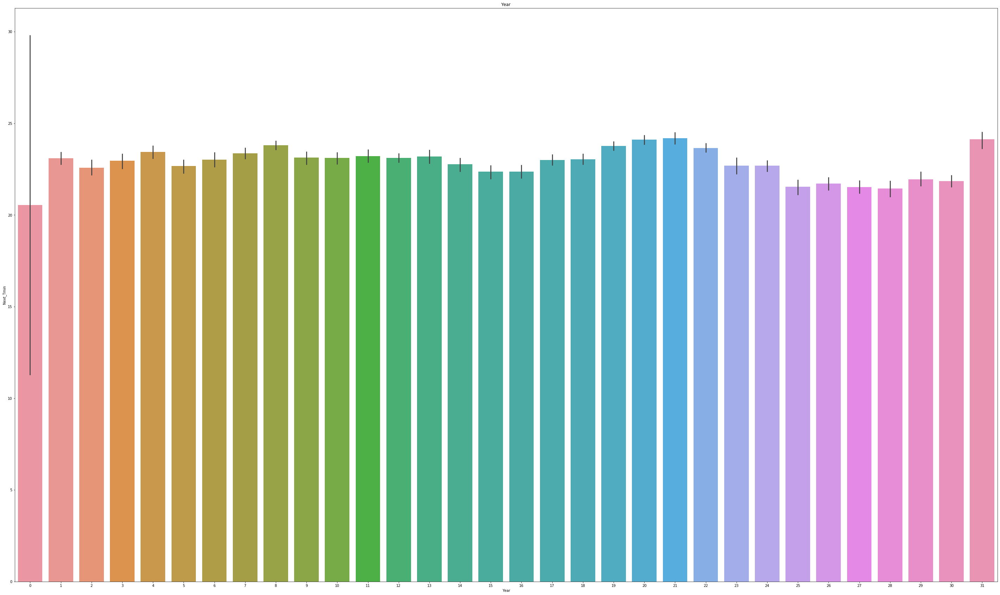

In [25]:
for i in df:
    plt.figure(figsize=(50,30))
    plt.clf() #clearing the figure
    sns.barplot(x=df[i],y=df['Next_Tmin'],data=df)
    plt.title(i)
    plt.show()

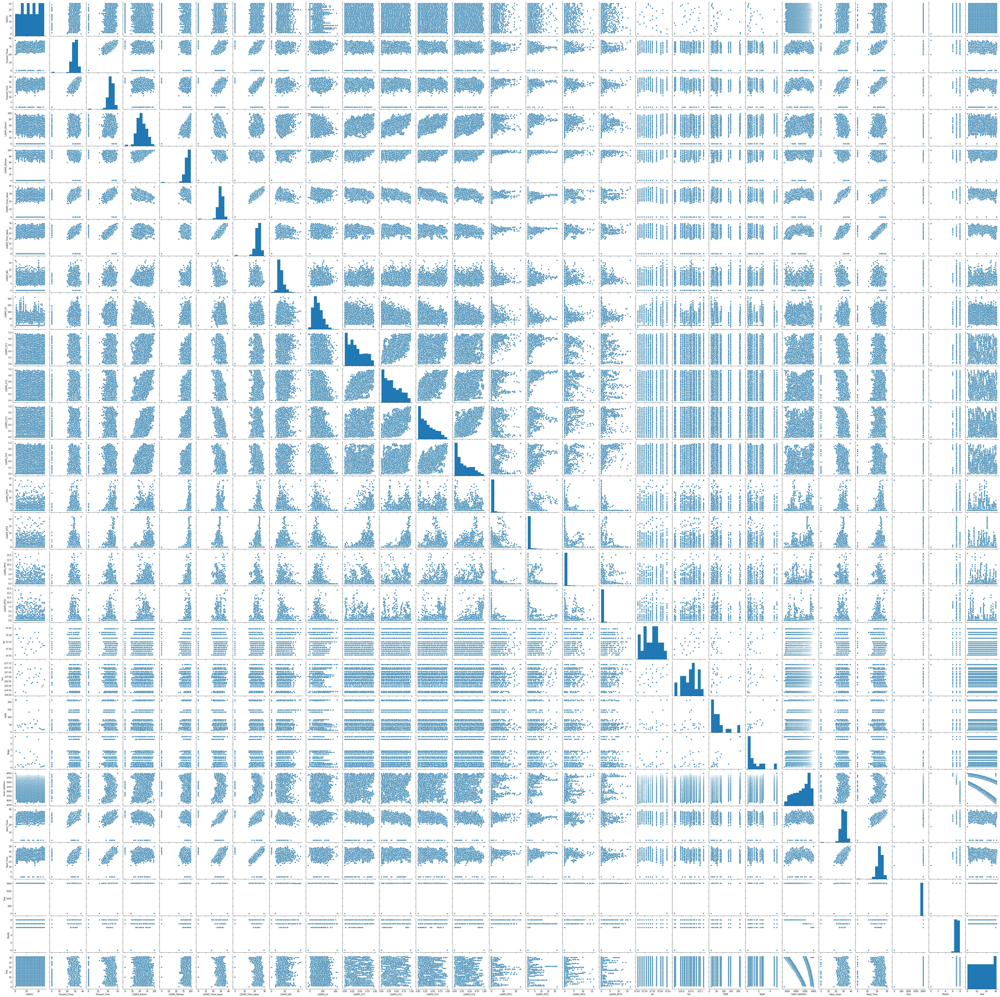

In [26]:
sns.pairplot(df)

In [27]:
x=df.drop(['Next_Tmax','Next_Tmin'],axis=True)
x.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,2013,6,30


In [32]:
y=df['Next_Tmax']
y.head()

0    29.1
1    30.5
2    31.1
3    31.7
4    31.2
Name: Next_Tmax, dtype: float64

In [34]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-1.66315300e+00, -1.95796100e-01, -4.96132425e-01, ...,
        -4.56940605e-02, -2.69636802e+00,  1.57166882e+00],
       [-1.52451817e+00,  5.87969654e-01, -4.34704732e-01, ...,
        -4.56940605e-02, -2.69636802e+00,  1.57166882e+00],
       [-1.38588334e+00,  5.14491614e-01,  8.74306564e-02, ...,
        -4.56940605e-02, -2.69636802e+00,  1.57166882e+00],
       ...,
       [ 1.66408295e+00, -1.54289349e+00, -1.72468628e+00, ...,
         7.77922065e-02,  9.82633105e-01,  1.57166882e+00],
       [-1.80178783e+00, -2.32665924e+00, -3.59823091e+00, ...,
        -6.21901579e+01, -1.37333714e+01, -1.79132792e+00],
       [-1.80178783e+00,  1.98405240e+00,  2.11454452e+00, ...,
        -6.21901579e+01, -1.37333714e+01, -1.79132792e+00]])

In [35]:
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.4,random_state=56)

In [36]:
print(x_train.shape,x_test.shape)

(4651, 25) (3101, 25)


In [42]:
LR=LinearRegression()
KNR=KNeighborsRegressor()
DTR=DecisionTreeRegressor(random_state=97)
ABR=AdaBoostRegressor(random_state=97)
RFR=RandomForestRegressor(random_state=97)
GBR=GradientBoostingRegressor(random_state=97)
XGR=XGBRegressor(random_state=97)

In [44]:
models=[]
models.append(('LinearRegression',LR))
models.append(('DecisionTreeRegressor',DTR))
models.append(('KNeighborsRegressor',KNR))
models.append(('AdaBoostRegressor',ABR))
models.append(('RandomForestRegressor',RFR))
models.append(('GradientBoostingRegressor',GBR))
models.append(('XGBRegressor',XGR))

In [45]:
Model=[]
R2_score=[]
cvs=[]
MSE=[]
for name,model in models:
    print('*********************************',name,'*********************************')
    print('\n',model)
    Model.append(name)
    model.fit(x_train,y_train)
    pre=model.predict(x_test)
    r2=r2_score(y_test,pre)
    print('R2_score = ',r2)
    R2_score.append(r2)
    mse=mean_squared_error(y_test,pre)
    print("Mean_Squared_Error =",mse)
    MSE.append(round(mse,3))
    score= cross_val_score(model,x,y,cv=10,scoring='r2').mean()
    print('Cross_Val_Score = ',score)
    cvs.append(score)
    print('\n')

********************************* LinearRegression *********************************

 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
R2_score =  0.5253463541542376
Mean_Squared_Error = 6.787746796925371
Cross_Val_Score =  -0.22867606405788488


********************************* DecisionTreeRegressor *********************************

 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=97, splitter='best')
R2_score =  0.41833085071630327
Mean_Squared_Error = 8.318113511770397
Cross_Val_Score =  -0.32809361698362316


********************************* KNeighborsRegressor *********************************

 KNeighborsRegressor(algorit

In [47]:
result = pd.DataFrame({'Model': Model, 'R2_score': score ,'Mean_Squared_Error':MSE, 'Cross_val_score':cvs,})
result

,Model,R2_score,Mean_Squared_Error,Cross_val_score
0,LinearRegression,0.397321,6.788,-0.228676
1,DecisionTreeRegressor,0.397321,8.318,-0.328094
2,KNeighborsRegressor,0.397321,6.304,0.292384
3,AdaBoostRegressor,0.397321,14.252,-0.262121
4,RandomForestRegressor,0.397321,5.473,0.467162
5,GradientBoostingRegressor,0.397321,5.578,0.501293
6,XGBRegressor,0.397321,5.275,0.397321


In [48]:
y=df['Next_Tmin']
y.head()

0    21.2
1    22.5
2    23.9
3    24.3
4    22.5
Name: Next_Tmin, dtype: float64

In [49]:
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.4,random_state=56)

In [50]:
LR=LinearRegression()
KNR=KNeighborsRegressor()
DTR=DecisionTreeRegressor(random_state=97)
ABR=AdaBoostRegressor(random_state=97)
RFR=RandomForestRegressor(random_state=97)
GBR=GradientBoostingRegressor(random_state=97)
XGR=XGBRegressor(random_state=97)

In [51]:
models=[]
models.append(('LinearRegression',LR))
models.append(('DecisionTreeRegressor',DTR))
models.append(('KNeighborsRegressor',KNR))
models.append(('AdaBoostRegressor',ABR))
models.append(('RandomForestRegressor',RFR))
models.append(('GradientBoostingRegressor',GBR))
models.append(('XGBRegressor',XGR))

In [52]:
Model=[]
R2_score=[]
cvs=[]
MSE=[]
for name,model in models:
    print('*********************************',name,'*********************************')
    print('\n',model)
    Model.append(name)
    model.fit(x_train,y_train)
    pre=model.predict(x_test)
    r2=r2_score(y_test,pre)
    print('R2_score = ',r2)
    R2_score.append(r2)
    mse=mean_squared_error(y_test,pre)
    print("Mean_Squared_Error =",mse)
    MSE.append(round(mse,3))
    score= cross_val_score(model,x,y,cv=10,scoring='r2').mean()
    print('Cross_Val_Score = ',score)
    cvs.append(score)
    print('\n')

********************************* LinearRegression *********************************

 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)
R2_score =  0.549277541679308
Mean_Squared_Error = 3.9828634739602133
Cross_Val_Score =  0.17925826068576467


********************************* DecisionTreeRegressor *********************************

 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=97, splitter='best')
R2_score =  0.3659597495068154
Mean_Squared_Error = 5.602773298935826
Cross_Val_Score =  -0.43060484380654296


********************************* KNeighborsRegressor *********************************

 KNeighborsRegressor(algorithm

In [53]:
result = pd.DataFrame({'Model': Model, 'R2_score': score ,'Mean_Squared_Error':MSE, 'Cross_val_score':cvs,})
result

,Model,R2_score,Mean_Squared_Error,Cross_val_score
0,LinearRegression,0.283604,3.983,0.179258
1,DecisionTreeRegressor,0.283604,5.603,-0.430605
2,KNeighborsRegressor,0.283604,4.033,0.186442
3,AdaBoostRegressor,0.283604,5.984,-0.418013
4,RandomForestRegressor,0.283604,3.273,0.471637
5,GradientBoostingRegressor,0.283604,3.449,0.541229
6,XGBRegressor,0.283604,3.400,0.283604


In [55]:
y=pd.concat(['Next_Tmax','Next_Tmin'])
y

TypeError: cannot concatenate object of type '<class 'str'>'; only Series and DataFrame objs are valid

In [56]:
from sklearn.externals import joblib
joblib.dump(RFR,'temp.pkl')

['temp.pkl']